In [142]:
import yt
from netCDF4 import Dataset
import numpy as np
import ipywidgets
import matplotlib.pyplot as plt
import matplotlib

In [3]:
data_filename = "data/MERRA-2/MERRA2_200.instU_3d_ana_Np.199811.nc4"

nc_dataset = Dataset(data_filename, 'r+')

In [3]:
nc_dataset

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    History: Original file generated: Thu Jun 18 10:35:27 2015 GMT
    Filename: MERRA2_200.instU_3d_ana_Np.199811.nc4
    Comment: GMAO filename: d5124_m2_jan91.inst6_3d_ana_Np.diurnal.199811.nc4
    Conventions: CF-1
    Institution: NASA Global Modeling and Assimilation Office
    References: http://gmao.gsfc.nasa.gov
    Format: NetCDF-4/HDF-5
    SpatialCoverage: global
    VersionID: 5.12.4
    TemporalRange: 1980-01-01 -> 2016-12-31
    identifier_product_doi_authority: http://dx.doi.org/
    ShortName: M2IUNPANA
    RangeBeginningDate: 1998-11-01
    RangeEndingDate: 1998-11-30
    GranuleID: MERRA2_200.instU_3d_ana_Np.199811.nc4
    ProductionDateTime: Original file generated: Thu Jun 18 10:35:27 2015 GMT
    LongName: MERRA2 inst6_3d_ana_Np: 3d,6-Hourly,Instantaneous,Pressure-Level,Analysis,Analyzed Meteorological Fields Diurnal Mean
    Title: MERRA2 inst6_3d_ana_Np: 3d,6-Hourly,Instantaneo

In [4]:
latitude = np.sort(nc_dataset.variables["lat"][:])
longitude = np.sort(nc_dataset.variables["lon"][:])
depth = np.sort(nc_dataset.variables["lev"][:])
times = np.sort(nc_dataset.variables["time"][:])
times

/Users/tzacks2/.conda/envs/DataViz/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  after removing the cwd from sys.path.


masked_array(data=[   0,  360,  720, 1080],
             mask=False,
       fill_value=999999,
            dtype=int32)

In [5]:
data = {}

print(nc_dataset.variables.keys())

v_names = ('H', 'T', 'U', 'V','QV','O3')

dict_keys(['lon', 'lat', 'lev', 'time', 'SLP', 'PS', 'H', 'T', 'U', 'V', 'QV', 'O3'])


In [8]:
print(depth.shape,latitude.shape,longitude.shape)

(42,) (361,) (576,)


In [7]:
data = {v: nc_dataset.variables[v][:,:,:] for v in v_names}

In [8]:
depth

masked_array(data=[1.00000001e-01, 3.00000012e-01, 4.00000006e-01,
                   5.00000000e-01, 6.99999988e-01, 1.00000000e+00,
                   2.00000000e+00, 3.00000000e+00, 4.00000000e+00,
                   5.00000000e+00, 7.00000000e+00, 1.00000000e+01,
                   2.00000000e+01, 3.00000000e+01, 4.00000000e+01,
                   5.00000000e+01, 7.00000000e+01, 1.00000000e+02,
                   1.50000000e+02, 2.00000000e+02, 2.50000000e+02,
                   3.00000000e+02, 3.50000000e+02, 4.00000000e+02,
                   4.50000000e+02, 5.00000000e+02, 5.50000000e+02,
                   6.00000000e+02, 6.50000000e+02, 7.00000000e+02,
                   7.25000000e+02, 7.50000000e+02, 7.75000000e+02,
                   8.00000000e+02, 8.25000000e+02, 8.50000000e+02,
                   8.75000000e+02, 9.00000000e+02, 9.25000000e+02,
                   9.50000000e+02, 9.75000000e+02, 1.00000000e+03],
             mask=False,
       fill_value=1e+20)

In [9]:
latitude

masked_array(data=[-90. , -89.5, -89. , -88.5, -88. , -87.5, -87. , -86.5,
                   -86. , -85.5, -85. , -84.5, -84. , -83.5, -83. , -82.5,
                   -82. , -81.5, -81. , -80.5, -80. , -79.5, -79. , -78.5,
                   -78. , -77.5, -77. , -76.5, -76. , -75.5, -75. , -74.5,
                   -74. , -73.5, -73. , -72.5, -72. , -71.5, -71. , -70.5,
                   -70. , -69.5, -69. , -68.5, -68. , -67.5, -67. , -66.5,
                   -66. , -65.5, -65. , -64.5, -64. , -63.5, -63. , -62.5,
                   -62. , -61.5, -61. , -60.5, -60. , -59.5, -59. , -58.5,
                   -58. , -57.5, -57. , -56.5, -56. , -55.5, -55. , -54.5,
                   -54. , -53.5, -53. , -52.5, -52. , -51.5, -51. , -50.5,
                   -50. , -49.5, -49. , -48.5, -48. , -47.5, -47. , -46.5,
                   -46. , -45.5, -45. , -44.5, -44. , -43.5, -43. , -42.5,
                   -42. , -41.5, -41. , -40.5, -40. , -39.5, -39. , -38.5,
                   -38. ,

In [10]:
longitude

masked_array(data=[-180.   , -179.375, -178.75 , -178.125, -177.5  ,
                   -176.875, -176.25 , -175.625, -175.   , -174.375,
                   -173.75 , -173.125, -172.5  , -171.875, -171.25 ,
                   -170.625, -170.   , -169.375, -168.75 , -168.125,
                   -167.5  , -166.875, -166.25 , -165.625, -165.   ,
                   -164.375, -163.75 , -163.125, -162.5  , -161.875,
                   -161.25 , -160.625, -160.   , -159.375, -158.75 ,
                   -158.125, -157.5  , -156.875, -156.25 , -155.625,
                   -155.   , -154.375, -153.75 , -153.125, -152.5  ,
                   -151.875, -151.25 , -150.625, -150.   , -149.375,
                   -148.75 , -148.125, -147.5  , -146.875, -146.25 ,
                   -145.625, -145.   , -144.375, -143.75 , -143.125,
                   -142.5  , -141.875, -141.25 , -140.625, -140.   ,
                   -139.375, -138.75 , -138.125, -137.5  , -136.875,
                   -136.25 , -135.

In [11]:
for i in data:
    print(f'{i},{data[i][0]}')

H,[[[  -87.49008    -87.49008    -87.49008  ...   -87.49008    -87.49008
     -87.49008 ]
  [  -92.632706   -92.671776   -92.710106 ...   -92.51124    -92.55233
     -92.59274 ]
  [  -98.53137    -98.58027    -98.62724  ...   -98.37309    -98.42783
     -98.4807  ]
  ...
  [  174.59856    174.53996    174.48083  ...   174.77202    174.71469
     174.65686 ]
  [  173.15334    173.12305    173.09253  ...   173.24297    173.21327
     173.18329 ]
  [  171.80035    171.80035    171.80035  ...   171.80035    171.80035
     171.80035 ]]

 [[  103.668655   103.668655   103.668655 ...   103.668655   103.668655
     103.668655]
  [   98.37913     98.34226     98.30616  ...    98.49418     98.45519
      98.416916]
  [   92.21017     92.16404     92.11992  ...    92.36067     92.30844
      92.25816 ]
  ...
  [  362.45792    362.4025     362.3467   ...   362.62238    362.56796
     362.51312 ]
  [  361.1033     361.07483    361.04614  ...   361.18747    361.15958
     361.1314  ]
  [  359.80933 

In [12]:
#time level latitude longitude
bbox = np.array([[depth[0], depth[-1]],
                [latitude[0], latitude[-1]],
                [longitude[0],longitude[-1]]])
bbox

array([[ 1.00000001e-01,  1.00000000e+03],
       [-9.00000000e+01,  9.00000000e+01],
       [-1.80000000e+02,  1.79375000e+02]])

In [13]:
for i in data.keys():
    print(data[i].shape)

(4, 42, 361, 576)
(4, 42, 361, 576)
(4, 42, 361, 576)
(4, 42, 361, 576)
(4, 42, 361, 576)
(4, 42, 361, 576)


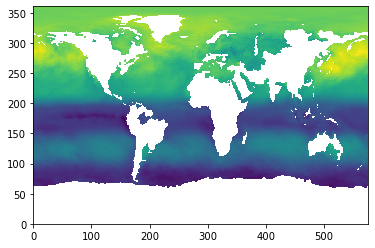

In [15]:
plt.pcolormesh(data['O3'][0][0])

/Users/tzacks2/.conda/envs/DataViz/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


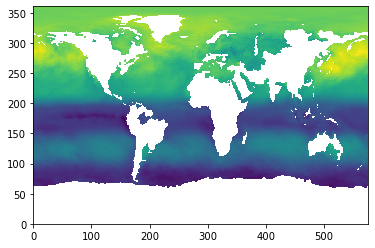

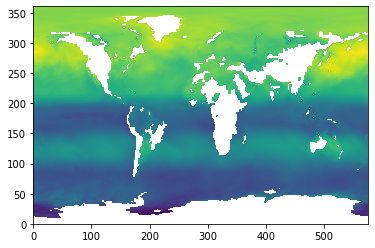

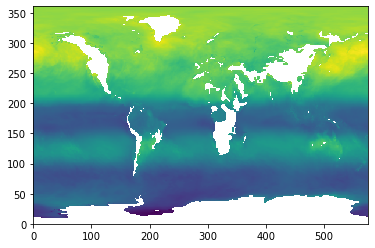

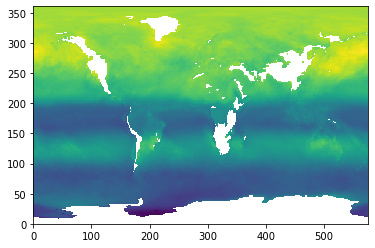

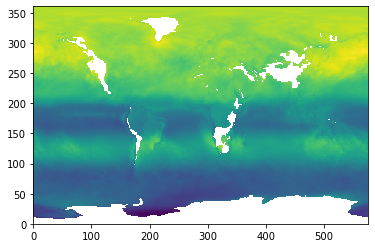

...

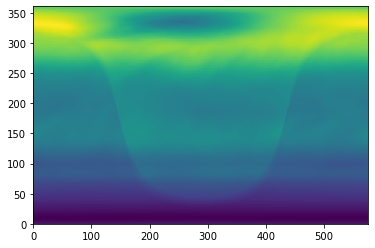

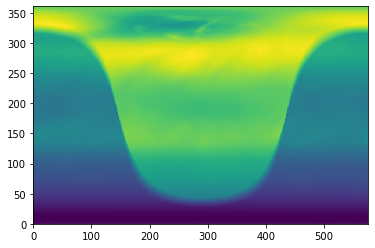

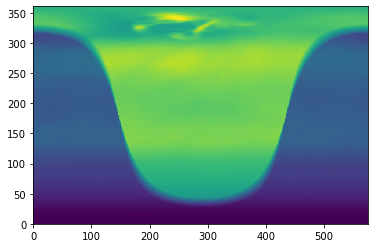

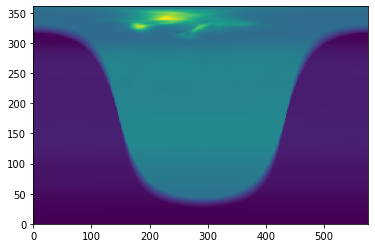

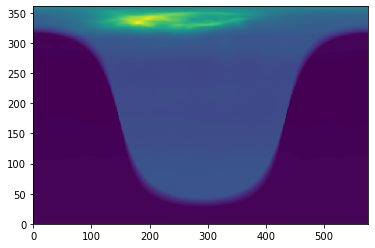

In [16]:
for i in range(len(data['O3'][0])):
    plt.figure()
    plt.pcolormesh(data['O3'][0][i])

/Users/tzacks2/.conda/envs/DataViz/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


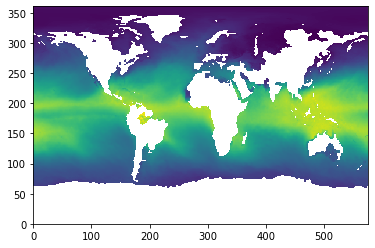

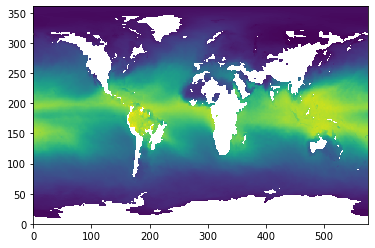

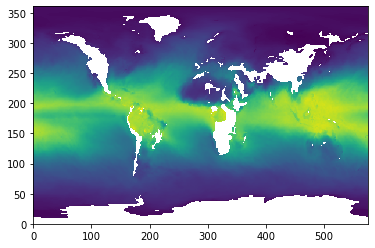

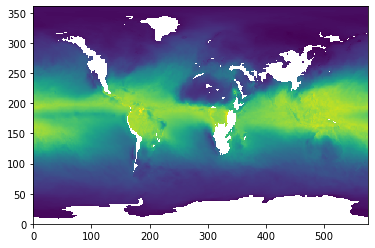

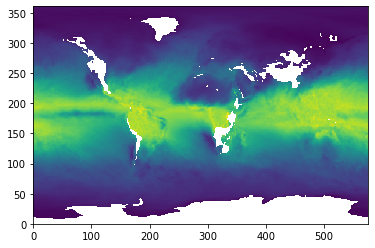

...

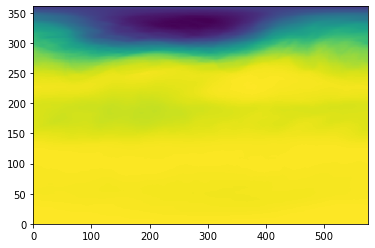

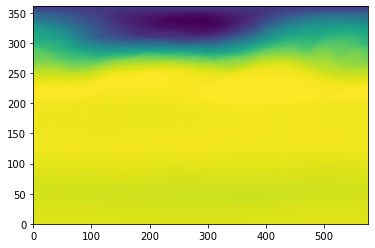

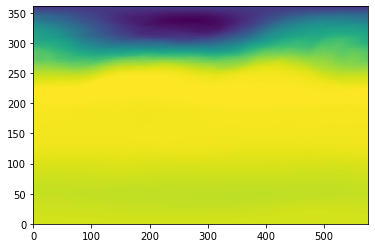

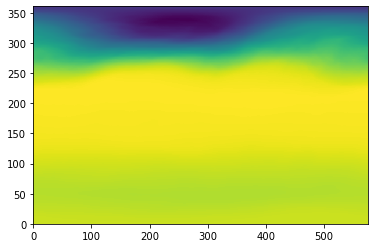

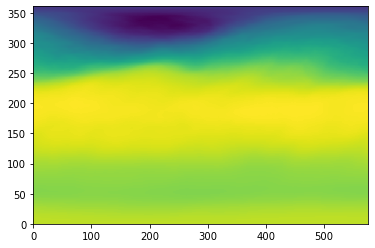

In [17]:
for i in range(len(data['O3'][0])):
    plt.figure()
    plt.pcolormesh(data['QV'][0][i])

H [[[  -76.925674   -76.925674   -76.925674 ...   -76.925674   -76.925674
     -76.925674]
  [  -82.63192    -82.667816   -82.702995 ...   -82.51897    -82.557335
     -82.595024]
  [  -91.58471    -91.650856   -91.71444  ...   -91.37031    -91.444336
     -91.51578 ]
  ...
  [  172.18024    172.12645    172.07233  ...   172.33942    172.28662
     172.23369 ]
  [  170.51894    170.49142    170.46387  ...   170.60002    170.57321
     170.54622 ]
  [  168.69827    168.69827    168.69827  ...   168.69827    168.69827
     168.69827 ]]

 [[  113.83109    113.83109    113.83109  ...   113.83109    113.83109
     113.83109 ]
  [  107.95707    107.92265    107.888985 ...   108.06579    108.0288
     107.992516]
  [   98.739235    98.67549     98.614365 ...    98.946884    98.875046
      98.80585 ]
  ...
  [  359.7841     359.73447    359.68457  ...   359.9311     359.8823
     359.83344 ]
  [  358.23904    358.21405    358.18903  ...   358.31262    358.2883
     358.2638  ]
  [  356.6407  

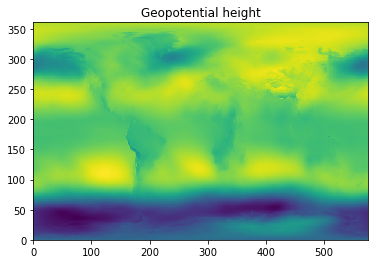

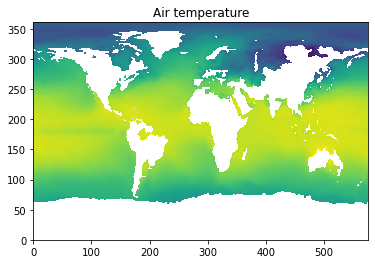

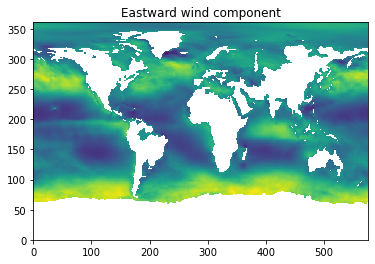

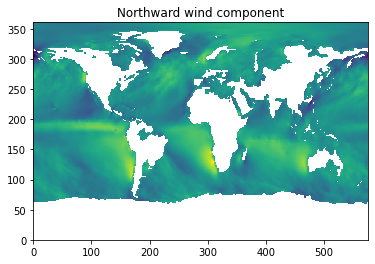

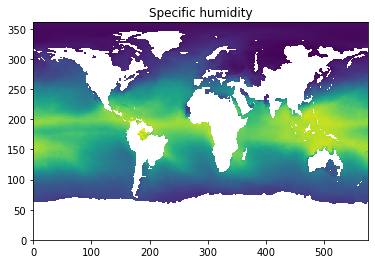

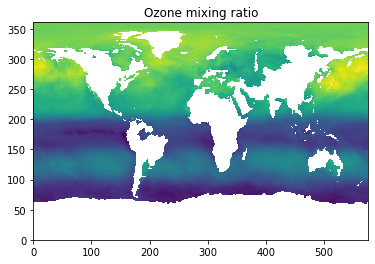

In [18]:
for i in data:
    print(i,data[i][1])
    plt.figure()
    plt.pcolormesh(data[i][0][0])
    plt.title(nc_dataset[i].long_name)
    plt.pcolormesh(data[i][0][0])


In [20]:
from natsort import index_natsorted
def yt_load(time):

    data = {}
    v_names = ('H', 'T', 'U', 'V','QV','O3')
    data = {v: nc_dataset.variables[v][:,:,:][time] for v in v_names}
#     print(data)
    latitude = np.sort(nc_dataset.variables["lat"][:])
    longitude = np.sort(nc_dataset.variables["lon"][:])
    depth = np.sort(nc_dataset.variables["lev"][:])

    bbox = np.array([[depth[0], depth[-1]],
                [latitude[0], latitude[-1]],
                [longitude[0],longitude[-1]]],dtype='f8')

    ds = yt.load_uniform_grid(data, domain_dimensions = (depth.shape[0], latitude.shape[0], longitude.shape[0]),
                          bbox = bbox,
                          geometry = ("internal_geographic", ("depth", "latitude", "longitude")))
    times = np.sort(nc_dataset.variables["time"][:])
    time = f'{(times[time])/60} hrs'
    return (ds,time)

In [22]:
t0 = yt_load(0)
t1 = yt_load(1)
t2 = yt_load(2)
t3 = yt_load(3)
print(t0[1],t1[1],t2[1],t3[1])

yt : [INFO     ] 2022-06-28 16:00:13,509 Parameters: current_time              = 0.0
yt : [INFO     ] 2022-06-28 16:00:13,509 Parameters: domain_dimensions         = [ 42 361 576]
yt : [INFO     ] 2022-06-28 16:00:13,510 Parameters: domain_left_edge          = [ 1.00000001e-01 -9.00000000e+01 -1.80000000e+02]
yt : [INFO     ] 2022-06-28 16:00:13,510 Parameters: domain_right_edge         = [1000.      90.     179.375]
yt : [INFO     ] 2022-06-28 16:00:13,510 Parameters: cosmological_simulation   = 0
/Users/tzacks2/.conda/envs/DataViz/lib/python3.7/site-packages/ipykernel_launcher.py:19: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
yt : [INFO     ] 2022-06-28 16:00:16,833 Parameters: current_time              = 0.0
yt : [INFO     ] 2022-06-28 16:00:16,833 Parameters: domain_dimensions         = [ 42 361 576]
yt : [INFO     ] 2022-06-28 16:00:16,834 Parameters: domain_left_edge          = [ 1.00000001e-01 -9.00000000e+01 -1.80000000e+02]


0.0 hrs 6.0 hrs 12.0 hrs 18.0 hrs


In [74]:
yt_time_list = [t0,t1,t2,t3]
yt_time_list[0][1]

'0.0 hrs'

In [26]:
t0[0].domain_width

In [28]:
t0[0].domain_left_edge

In [29]:
t0[0].domain_right_edge

yt : [INFO     ] 2022-06-28 16:01:18,440 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:18,440 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:18,441 Setting origin='native' for internal_geographic geometry.
yt : [INFO     ] 2022-06-28 16:01:18,441 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:18,442 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:18,442 Making a fixed resolution buffer of (('stream', 'H')) 800 by 800



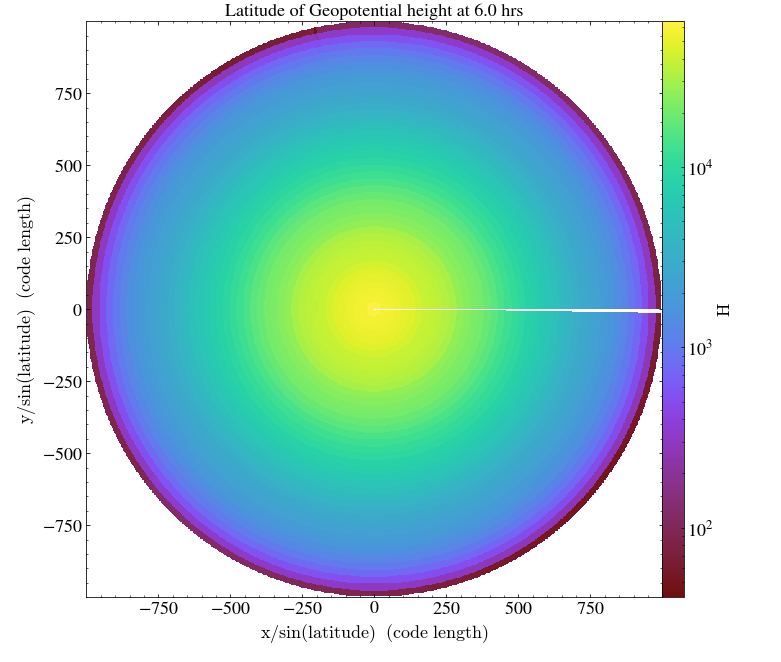

In [30]:
p = yt.SlicePlot(t1[0],'latitude','H')
title = nc_dataset['H'].long_name
p.annotate_title(f'Latitude of {title} at {t1[1]}')

yt : [INFO     ] 2022-06-28 16:01:20,447 xlim = 0.000000 999.900000
yt : [INFO     ] 2022-06-28 16:01:20,448 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:20,448 Setting origin='native' for internal_geographic geometry.
yt : [INFO     ] 2022-06-28 16:01:20,449 xlim = 0.000000 999.900000
yt : [INFO     ] 2022-06-28 16:01:20,449 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:20,451 Making a fixed resolution buffer of (('stream', 'H')) 800 by 800
yt : [WARNING  ] 2022-06-28 16:01:21,287 Plotting ('stream', 'H'): Both positive and negative values. Min = -186.1869354248047 dimensionless, Max = 66898.6328125 dimensionless.
yt : [WARNING  ] 2022-06-28 16:01:21,287 Switching to symlog colorbar scaling.



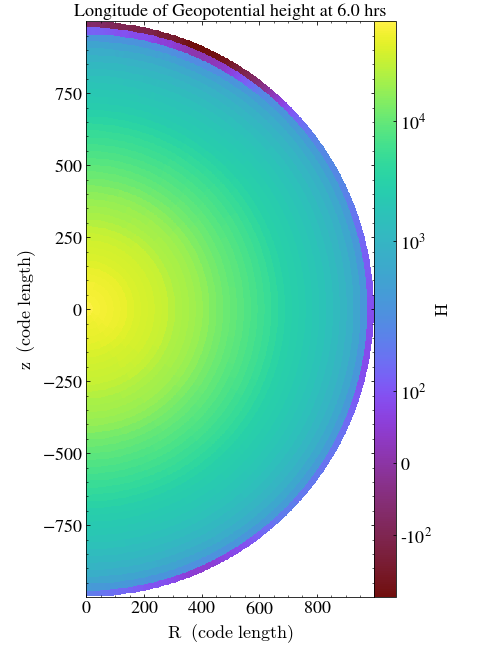

In [31]:
p = yt.SlicePlot(t1[0],'longitude','H')
title = nc_dataset['H'].long_name
p.annotate_title(f'Longitude of {title} at {t1[1]}')

In [32]:
nc_dataset['H'].long_name

'Geopotential height'

yt : [INFO     ] 2022-06-28 16:01:24,409 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:24,410 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:24,410 Setting origin='native' for internal_geographic geometry.
yt : [INFO     ] 2022-06-28 16:01:24,411 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:24,411 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:24,412 Making a fixed resolution buffer of (('stream', 'O3')) 800 by 800



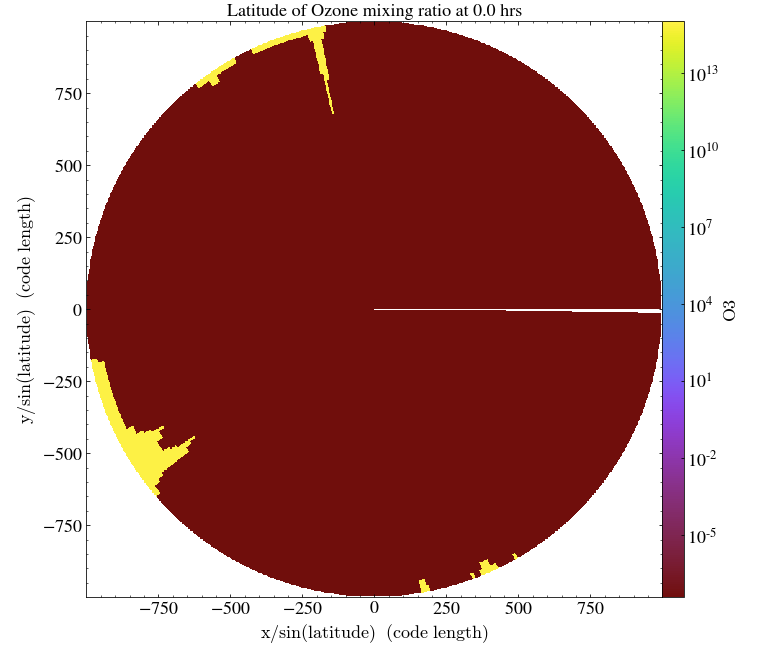

In [33]:
p = yt.SlicePlot(t0[0],'latitude','O3')
title = nc_dataset['O3'].long_name
p.annotate_title(f'Latitude of {title} at {t0[1]}')

yt : [INFO     ] 2022-06-28 16:01:29,515 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:29,516 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:29,516 Setting origin='native' for internal_geographic geometry.
yt : [INFO     ] 2022-06-28 16:01:29,518 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:29,518 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:29,520 Making a fixed resolution buffer of (('stream', 'O3')) 800 by 800



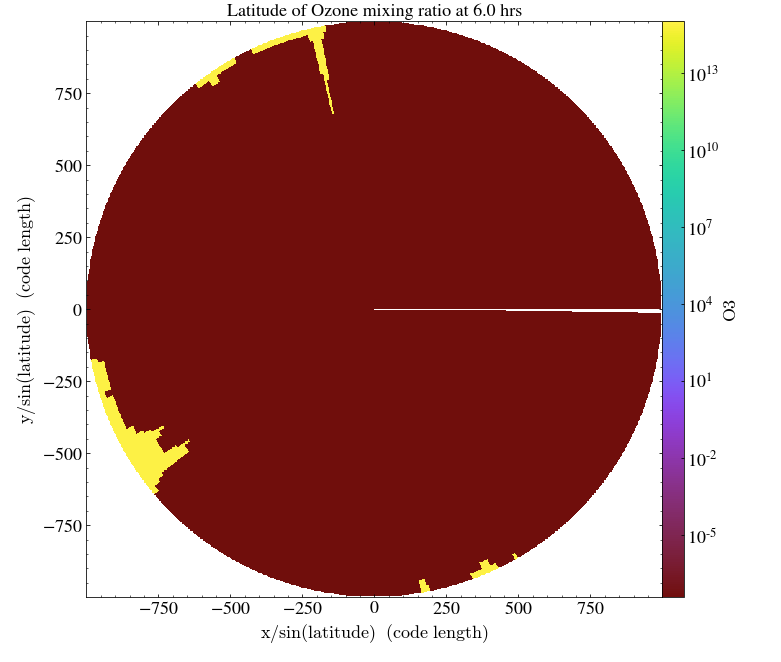

In [34]:
p = yt.SlicePlot(t1[0],'latitude','O3')
title = nc_dataset['O3'].long_name
p.annotate_title(f'Latitude of {title} at {t1[1]}')

yt : [INFO     ] 2022-06-28 16:01:30,282 xlim = 0.000000 999.900000
yt : [INFO     ] 2022-06-28 16:01:30,283 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:30,283 Setting origin='native' for internal_geographic geometry.
yt : [INFO     ] 2022-06-28 16:01:30,284 xlim = 0.000000 999.900000
yt : [INFO     ] 2022-06-28 16:01:30,284 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:30,284 Making a fixed resolution buffer of (('stream', 'O3')) 800 by 800



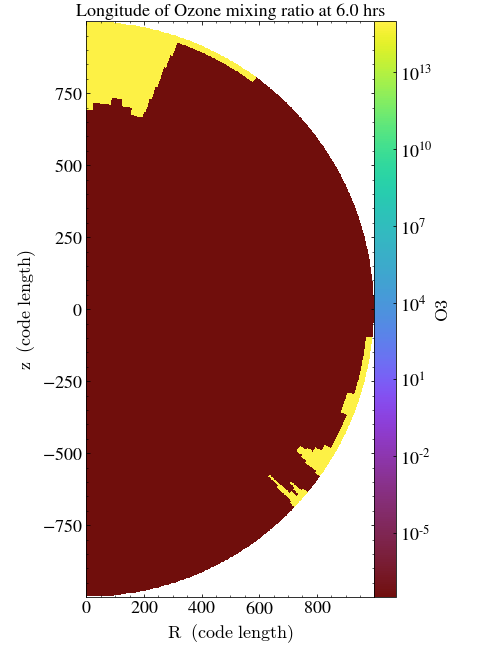

In [35]:
p = yt.SlicePlot(t1[0],'longitude','O3')
title = nc_dataset['O3'].long_name
p.annotate_title(f'Longitude of {title} at {t1[1]}')

yt : [INFO     ] 2022-06-28 16:01:41,973 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:41,974 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:41,974 Setting origin='native' for internal_geographic geometry.
yt : [INFO     ] 2022-06-28 16:01:41,977 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:41,978 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:41,979 Making a fixed resolution buffer of (('stream', 'QV')) 800 by 800



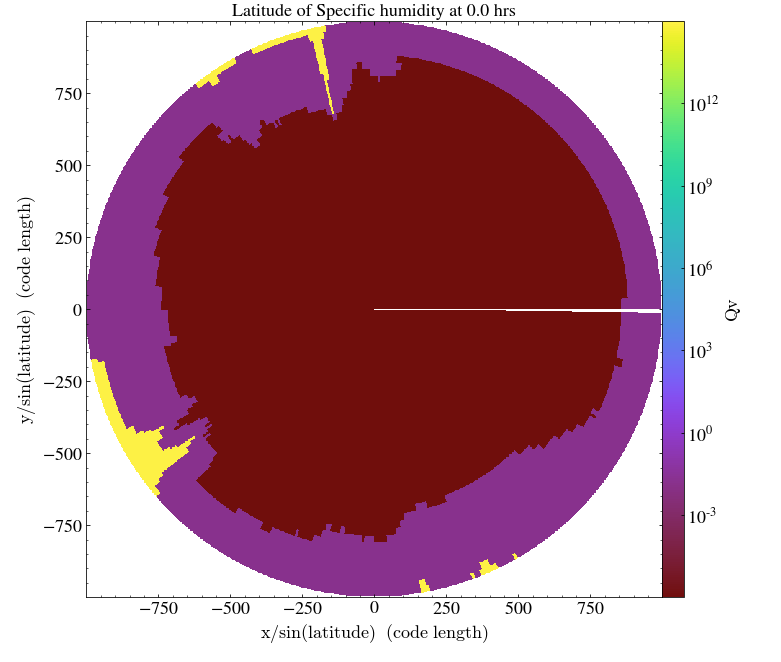

In [38]:
p = yt.SlicePlot(t0[0],'latitude','QV')
title = nc_dataset['QV'].long_name
p.annotate_title(f'Latitude of {title} at {t0[1]}')

yt : [INFO     ] 2022-06-28 16:01:44,568 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:44,569 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:44,569 Setting origin='native' for internal_geographic geometry.
yt : [INFO     ] 2022-06-28 16:01:44,571 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:44,572 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:44,573 Making a fixed resolution buffer of (('stream', 'QV')) 800 by 800



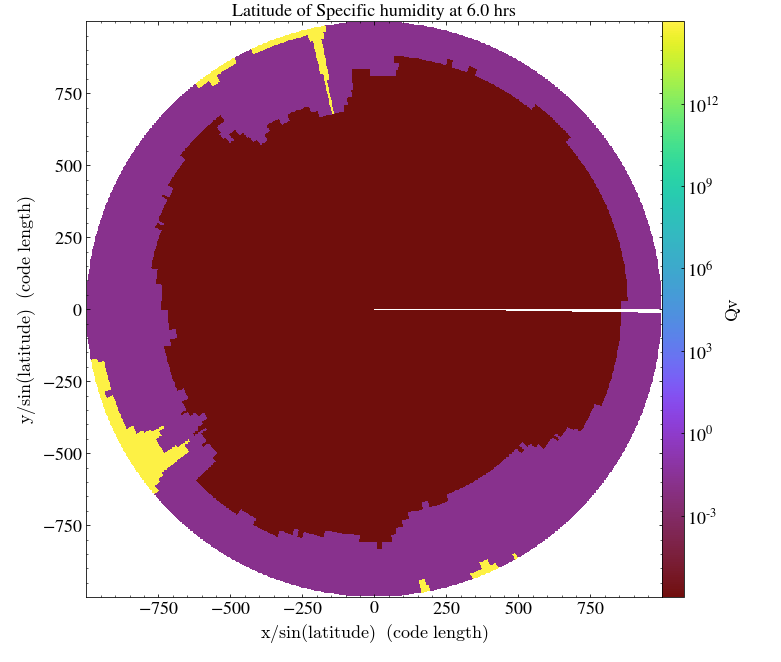

In [39]:
p = yt.SlicePlot(t1[0],'latitude','QV')
title = nc_dataset['QV'].long_name
p.annotate_title(f'Latitude of {title} at {t1[1]}')

yt : [INFO     ] 2022-06-28 16:01:46,264 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:46,266 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:46,266 Setting origin='native' for internal_geographic geometry.
yt : [INFO     ] 2022-06-28 16:01:46,269 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:46,270 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:46,272 Making a fixed resolution buffer of (('stream', 'U')) 800 by 800
yt : [WARNING  ] 2022-06-28 16:01:46,776 Plotting ('stream', 'U'): Both positive and negative values. Min = -29.969472885131836 dimensionless, Max = 999999986991104.0 dimensionless.
yt : [WARNING  ] 2022-06-28 16:01:46,776 Switching to symlog colorbar scaling.



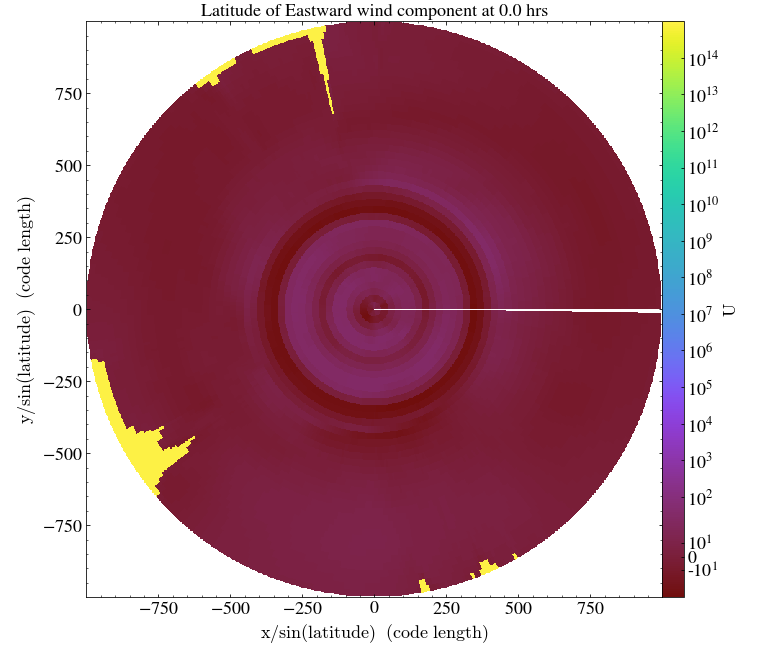

In [40]:
p = yt.SlicePlot(t0[0],'latitude','U')
title = nc_dataset['U'].long_name
p.annotate_title(f'Latitude of {title} at {t0[1]}')

yt : [INFO     ] 2022-06-28 16:01:52,524 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:52,525 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:52,526 Setting origin='native' for internal_geographic geometry.
yt : [INFO     ] 2022-06-28 16:01:52,528 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:52,530 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:52,531 Making a fixed resolution buffer of (('stream', 'V')) 800 by 800
yt : [WARNING  ] 2022-06-28 16:01:53,026 Plotting ('stream', 'V'): Both positive and negative values. Min = -8.543696403503418 dimensionless, Max = 999999986991104.0 dimensionless.
yt : [WARNING  ] 2022-06-28 16:01:53,026 Switching to symlog colorbar scaling.



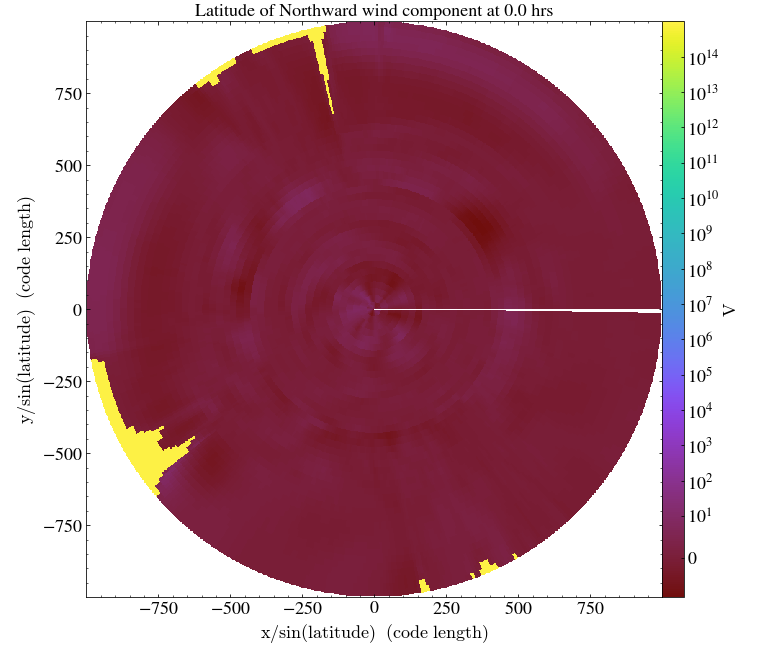

In [41]:
p = yt.SlicePlot(t0[0],'latitude','V')
title = nc_dataset['V'].long_name
p.annotate_title(f'Latitude of {title} at {t0[1]}')

yt : [INFO     ] 2022-06-28 16:01:53,476 xlim = 0.000000 999.900000
yt : [INFO     ] 2022-06-28 16:01:53,477 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:53,477 Setting origin='native' for internal_geographic geometry.
yt : [INFO     ] 2022-06-28 16:01:53,478 xlim = 0.000000 999.900000
yt : [INFO     ] 2022-06-28 16:01:53,478 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:53,479 Making a fixed resolution buffer of (('stream', 'U')) 800 by 800
yt : [WARNING  ] 2022-06-28 16:01:54,324 Plotting ('stream', 'U'): Both positive and negative values. Min = -59.808597564697266 dimensionless, Max = 999999986991104.0 dimensionless.
yt : [WARNING  ] 2022-06-28 16:01:54,325 Switching to symlog colorbar scaling.



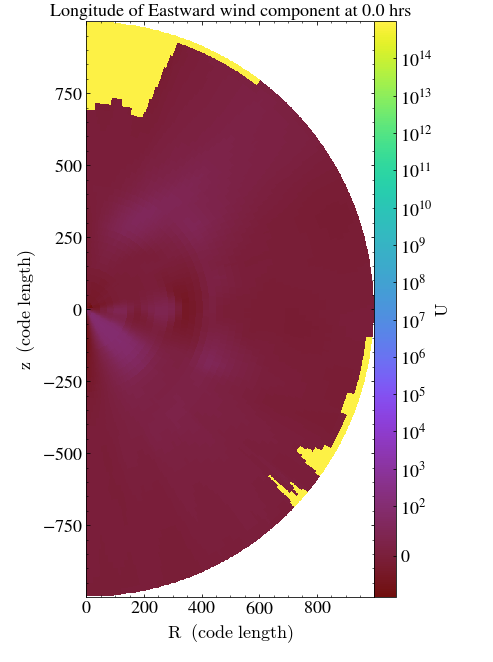

In [42]:
p = yt.SlicePlot(t0[0],'longitude','U')
title = nc_dataset['U'].long_name
p.annotate_title(f'Longitude of {title} at {t0[1]}')

yt : [INFO     ] 2022-06-28 16:01:54,802 xlim = 0.000000 999.900000
yt : [INFO     ] 2022-06-28 16:01:54,803 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:54,803 Setting origin='native' for internal_geographic geometry.
yt : [INFO     ] 2022-06-28 16:01:54,804 xlim = 0.000000 999.900000
yt : [INFO     ] 2022-06-28 16:01:54,804 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:01:54,805 Making a fixed resolution buffer of (('stream', 'V')) 800 by 800
yt : [WARNING  ] 2022-06-28 16:01:55,622 Plotting ('stream', 'V'): Both positive and negative values. Min = -20.502946853637695 dimensionless, Max = 999999986991104.0 dimensionless.
yt : [WARNING  ] 2022-06-28 16:01:55,623 Switching to symlog colorbar scaling.



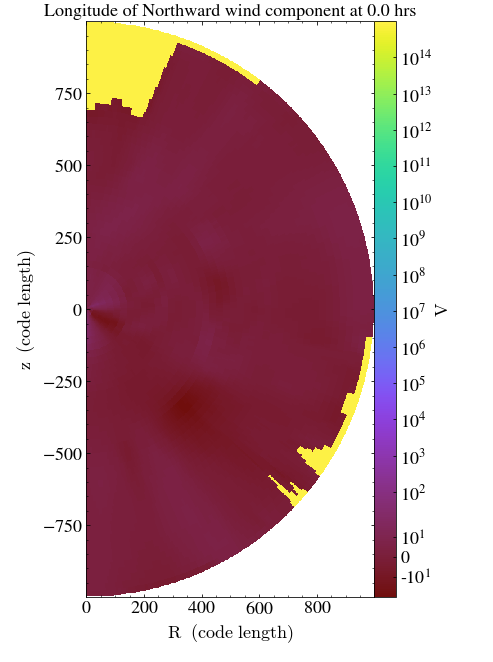

In [43]:
p = yt.SlicePlot(t0[0],'longitude','V')
title = nc_dataset['V'].long_name
p.annotate_title(f'Longitude of {title} at {t0[1]}')

In [99]:
t0 = yt_load(0)
t1 = yt_load(1)
t2 = yt_load(2)
t3 = yt_load(3)
print(t0[1],t1[1],t2[1],t3[1])

yt : [INFO     ] 2022-06-28 16:23:44,003 Parameters: current_time              = 0.0
yt : [INFO     ] 2022-06-28 16:23:44,003 Parameters: domain_dimensions         = [ 42 361 576]
yt : [INFO     ] 2022-06-28 16:23:44,004 Parameters: domain_left_edge          = [ 1.00000001e-01 -9.00000000e+01 -1.80000000e+02]
yt : [INFO     ] 2022-06-28 16:23:44,005 Parameters: domain_right_edge         = [1000.      90.     179.375]
yt : [INFO     ] 2022-06-28 16:23:44,005 Parameters: cosmological_simulation   = 0
/Users/tzacks2/.conda/envs/DataViz/lib/python3.7/site-packages/ipykernel_launcher.py:19: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
yt : [INFO     ] 2022-06-28 16:23:47,419 Parameters: current_time              = 0.0
yt : [INFO     ] 2022-06-28 16:23:47,420 Parameters: domain_dimensions         = [ 42 361 576]
yt : [INFO     ] 2022-06-28 16:23:47,420 Parameters: domain_left_edge          = [ 1.00000001e-01 -9.00000000e+01 -1.80000000e+02]


0.0 hrs 6.0 hrs 12.0 hrs 18.0 hrs


In [74]:
yt_time_list = [t0,t1,t2,t3]
yt_time_list[0][1]

'0.0 hrs'

In [109]:
time_slider = ipywidgets.SelectionSlider(options = [(t0[1],t0),(t1[1],t1),(t2[1],t2),(t3[1],t3)])
time_slider

SelectionSlider(options=(('0.0 hrs', (StreamDataset: InMemoryParameterFile_7c8745d121ce43838321063289dbf379, '…

In [108]:
@ipywidgets.interact(time = time_slider)
def print_time(time):
    print(time[1])

interactive(children=(SelectionSlider(description='time', options=(('0.0 hrs', (StreamDataset: InMemoryParamet…

In [45]:
lat_or_lon = ipywidgets.RadioButtons(options = ['latitude','longitude'])
lat_or_lon

RadioButtons(options=('latitude', 'longitude'), value='latitude')

In [46]:
v_names = ('H', 'T', 'U', 'V','QV','O3')

options = []
for i in range(0,6):
    options.append((f'{nc_dataset[v_names[i]].long_name}',v_names[i]))
variables = ipywidgets.Dropdown(options = options)
variables

Dropdown(options=(('Geopotential height', 'H'), ('Air temperature', 'T'), ('Eastward wind component', 'U'), ('…

In [47]:
color_logScale = ipywidgets.Checkbox(value = True,description = 'logScale')
color_logScale

Checkbox(value=True, description='logScale')

# For later: Want to create a histogram with the colorbar to see what should be cutoff

In [112]:
@ipywidgets.interact(time = time_slider,lat_or_lon=lat_or_lon,variable = variables)
def yt_plot(time,lat_or_lon,variable):
    p = yt.SlicePlot(time[0],lat_or_lon,variable)
    p.set_log(variable,True)
    title = nc_dataset[variable].long_name
    p.annotate_title(f'{lat_or_lon} of {title} at {time[1]}')
    p.show()

interactive(children=(SelectionSlider(description='time', options=(('0.0 hrs', (StreamDataset: InMemoryParamet…

In [113]:
depth_slider = ipywidgets.IntSlider(value=0,
    min=1,
    max=42)
depth_slider

IntSlider(value=1, max=42, min=1)

yt : [INFO     ] 2022-06-28 16:27:52,599 xlim = -180.000000 179.375000
yt : [INFO     ] 2022-06-28 16:27:52,601 ylim = -90.000000 90.000000
yt : [INFO     ] 2022-06-28 16:27:52,604 Making a fixed resolution buffer of (V) 800 by 800
yt : [INFO     ] 2022-06-28 16:27:52,792 Making a fixed resolution buffer of (('stream', 'V')) 800 by 800
yt : [WARNING  ] 2022-06-28 16:27:52,806 Plotting ('stream', 'V'): Both positive and negative values. Min = -13.841779708861957 dimensionless, Max = 999999986991300.1 dimensionless.
yt : [WARNING  ] 2022-06-28 16:27:52,806 Switching to symlog colorbar scaling.



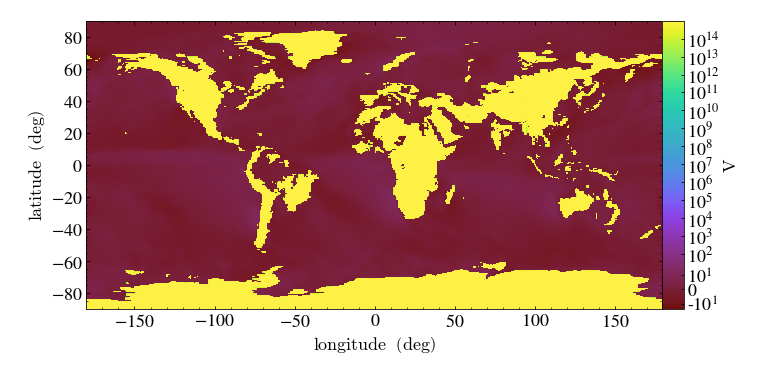


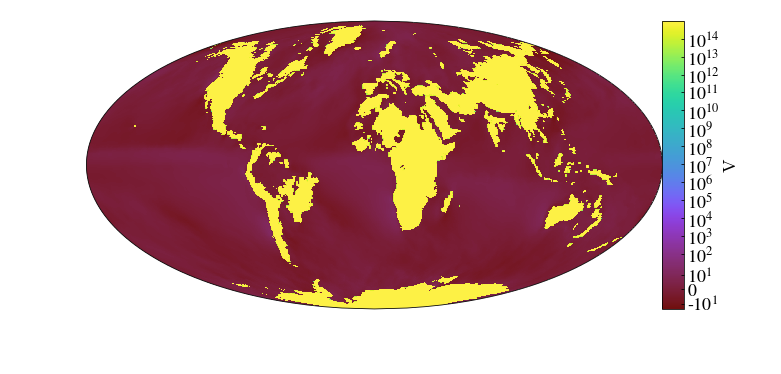

In [114]:
t1[0].r[36,:,:].plot("V").set_mpl_projection("Mollweide")

In [117]:
@ipywidgets.interact(depth = depth_slider,time = time_slider,lat_or_lon=lat_or_lon,variable = variables,logScale = color_logScale)
def yt_plot(depth,time,lat_or_lon,variable,logScale):
    p = t1[0].r[depth,:,:].plot("V").set_mpl_projection("Mollweide")
    title = nc_dataset[variable].long_name
    p.annotate_title(f'{lat_or_lon} of {title} at {time[1]}')
    if logScale == True:
        p.set_log(variable,True)
    else:
        p.set_log(variable,False)
    p.show()

interactive(children=(IntSlider(value=6, description='depth', max=42, min=1), SelectionSlider(description='tim…

In [118]:
ad = t0[0].all_data().include_below('V', 1e6)
ad

YTCutRegion (UniformGridData): , base_object=YTRegion (UniformGridData): , center=[ 5.0005e+02  0.0000e+00 -3.1250e-01] cm cm, left_edge=[ 1.00000001e-01 -9.00000000e+01 -1.80000000e+02] cm cm, right_edge=[1000.      90.     179.375] cm cm, conditionals=['obj["stream", "V"] < 1000000.0']

yt : [INFO     ] 2022-06-28 16:30:29,799 Projection completed
yt : [INFO     ] 2022-06-28 16:30:29,800 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:30:29,801 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:30:29,801 Setting origin='native' for internal_geographic geometry.
yt : [INFO     ] 2022-06-28 16:30:29,802 xlim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:30:29,802 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:30:29,803 Making a fixed resolution buffer of (('stream', 'V')) 800 by 800
yt : [WARNING  ] 2022-06-28 16:30:30,242 Plotting ('stream', 'V'): Both positive and negative values. Min = -4839.907787340313 cm, Max = 6738.7800212241655 cm.
yt : [WARNING  ] 2022-06-28 16:30:30,243 Switching to symlog colorbar scaling.



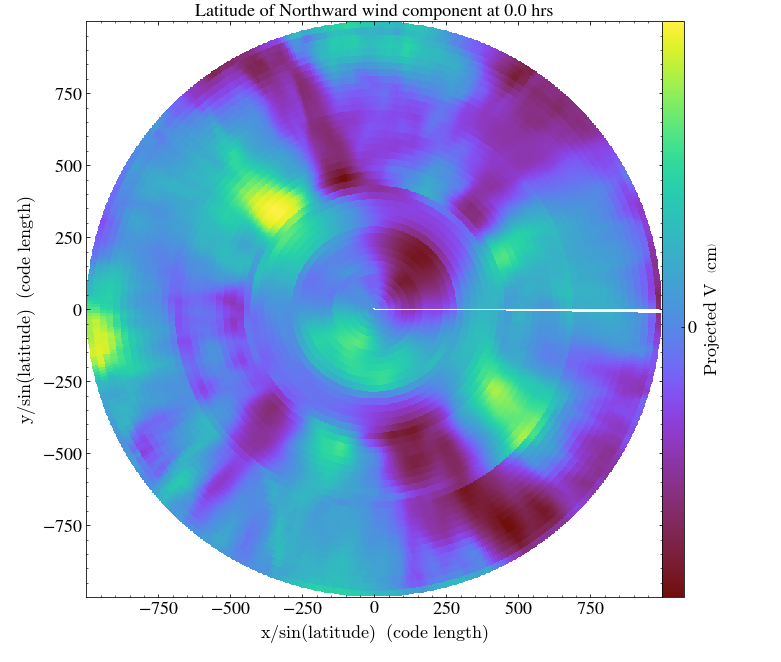

In [120]:
proj2 = yt.ProjectionPlot(t0[0], 'latitude', 'V', data_source=ad)
title = nc_dataset['V'].long_name
proj2.annotate_title(f'Latitude of {title} at {t0[1]}')
proj2.show()

yt : [INFO     ] 2022-06-28 16:30:59,199 xlim = 0.000000 999.900000
yt : [INFO     ] 2022-06-28 16:30:59,200 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:30:59,200 Setting origin='native' for internal_geographic geometry.
yt : [INFO     ] 2022-06-28 16:30:59,201 xlim = 0.000000 999.900000
yt : [INFO     ] 2022-06-28 16:30:59,201 ylim = -999.900000 999.900000
yt : [INFO     ] 2022-06-28 16:30:59,202 Making a fixed resolution buffer of (('stream', 'V')) 800 by 800
yt : [WARNING  ] 2022-06-28 16:31:00,673 Plotting ('stream', 'V'): Both positive and negative values. Min = -20.502946853637695 dimensionless, Max = 25.625595092773438 dimensionless.
yt : [WARNING  ] 2022-06-28 16:31:00,673 Switching to symlog colorbar scaling.



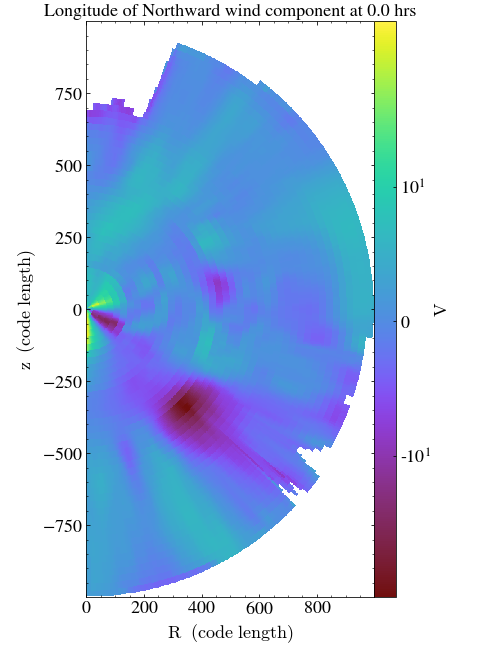

In [122]:
p = yt.SlicePlot(t0[0],'longitude','V',data_source=ad)
title = nc_dataset['V'].long_name
p.annotate_title(f'Longitude of {title} at {t0[1]}')

In [124]:
@ipywidgets.interact(time = time_slider,lat_or_lon=lat_or_lon,variable = variables,logScale = color_logScale)
def yt_plot(time,lat_or_lon,variable,logScale):
    p = yt.SlicePlot(time[0],lat_or_lon,variable,data_source=(time[0].all_data().include_below(variable, 10e10)))
    title = nc_dataset[variable].long_name
    p.annotate_title(f'L{lat_or_lon[1::]} of {title} at {time[1]}')
    p.set_figure_size(3)
    if logScale == True:
        p.set_log(variable,True)
    else:
        p.set_log(variable,False)
    p.show()

interactive(children=(SelectionSlider(description='time', index=1, options=(('0.0 hrs', (StreamDataset: InMemo…

/Users/tzacks2/.conda/envs/DataViz/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


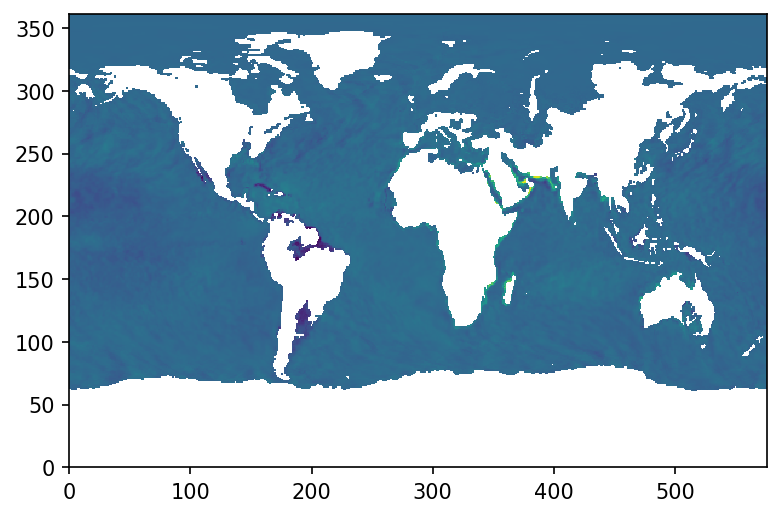

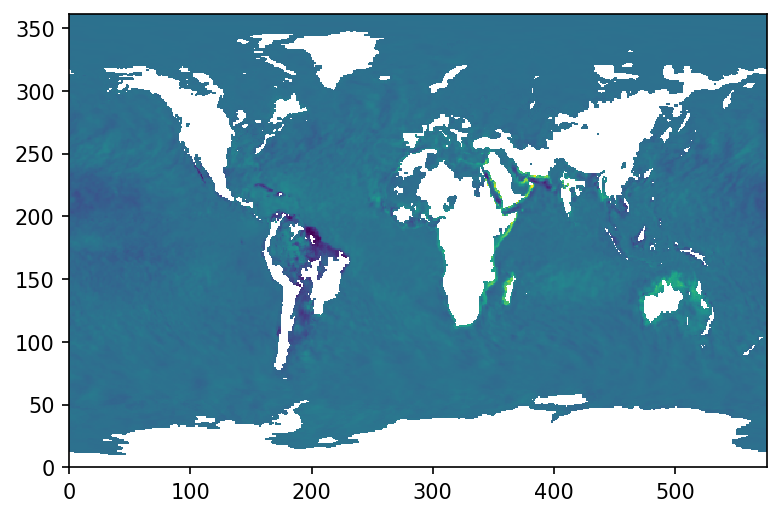

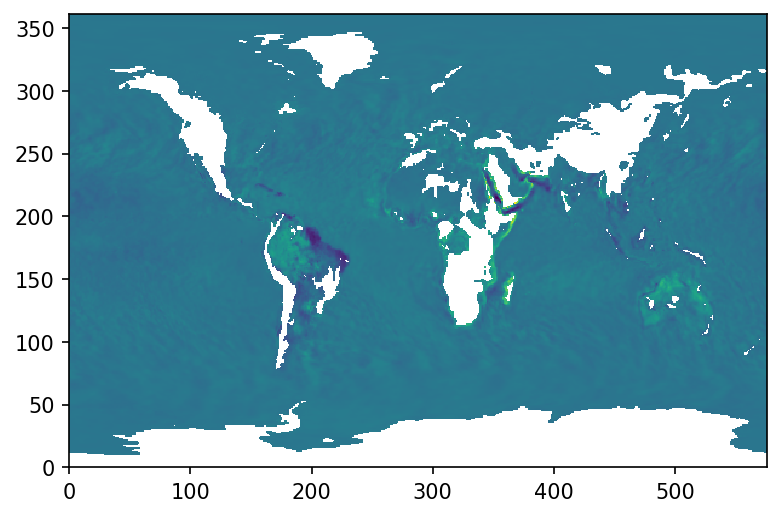

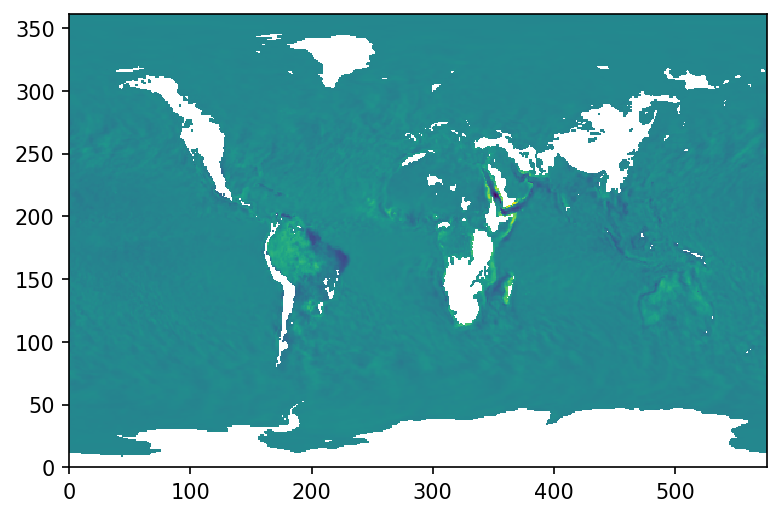

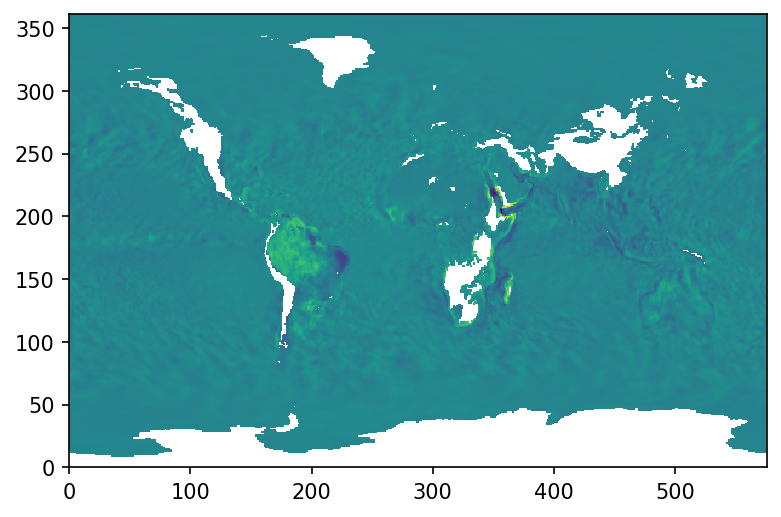

...

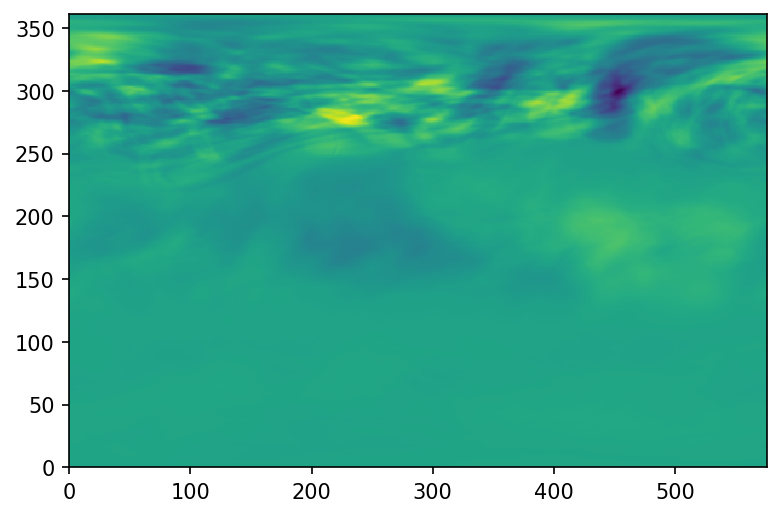

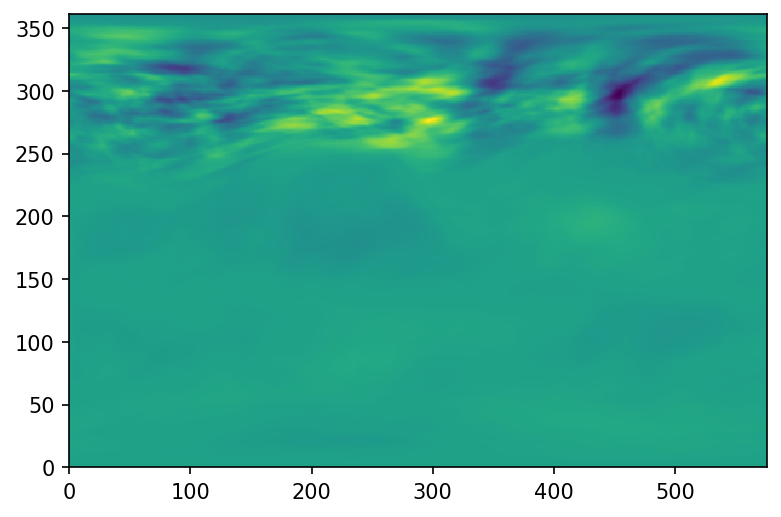

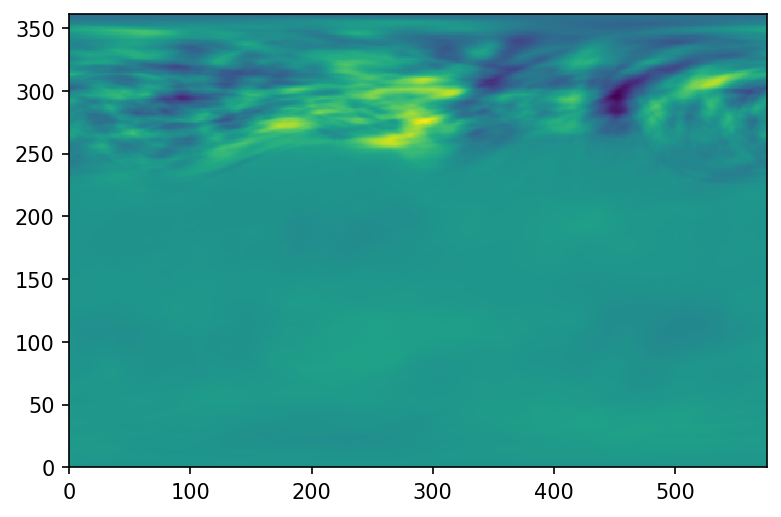

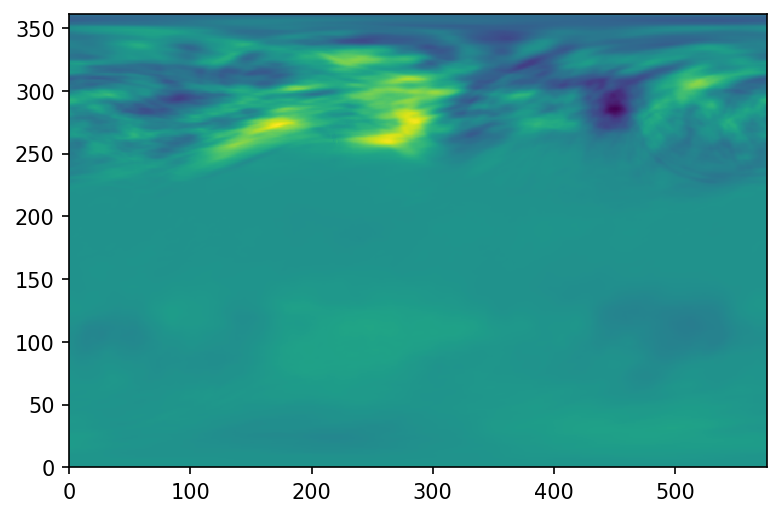

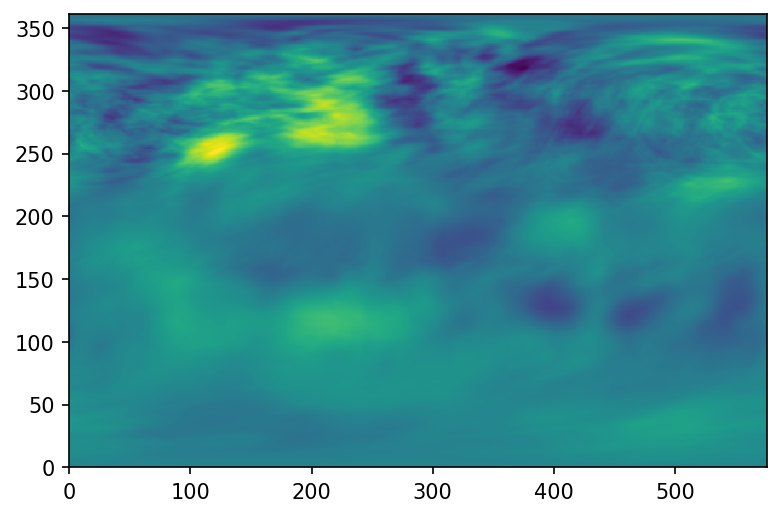

In [146]:
matplotlib.rcParams['figure.dpi']=150
for i in range(len(data['QV'][3]-data['QV'][2])):
    plt.figure()
    plt.pcolormesh(((data['QV'][3]-data['QV'][2])[i]))